In [217]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
from sklearn.neighbors import KNeighborsRegressor
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import Normalizer, StandardScaler, Binarizer, OneHotEncoder, MinMaxScaler, LabelEncoder
from sklearn.neural_network import MLPRegressor
import datetime
import re

In [2]:
# pip install xlrd

In [218]:
data = pd.read_excel('regression_data.xls')

In [219]:
data.head() 

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
0,7129300520,2014-10-13,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,221900
1,6414100192,2014-12-09,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,538000
2,5631500400,2015-02-25,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,180000
3,2487200875,2014-12-09,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,604000
4,1954400510,2015-02-18,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,510000


In [220]:
data.dtypes

id                        int64
date             datetime64[ns]
bedrooms                  int64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront                int64
view                      int64
condition                 int64
grade                     int64
sqft_above                int64
sqft_basement             int64
yr_built                  int64
yr_renovated              int64
zipcode                   int64
lat                     float64
long                    float64
sqft_living15             int64
sqft_lot15                int64
price                     int64
dtype: object

- price = target. 
- Columns to consider dropping: ID, lat & long, sqft_living, sqft_lot (opt for 15 instead)
- observation: the features are all discreet numerical values
- extract year from date and drop.


In [221]:
data.info() # checking shape (21597 x 21), dtypes and for nulls (no NAs)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   date           21597 non-null  datetime64[ns]
 2   bedrooms       21597 non-null  int64         
 3   bathrooms      21597 non-null  float64       
 4   sqft_living    21597 non-null  int64         
 5   sqft_lot       21597 non-null  int64         
 6   floors         21597 non-null  float64       
 7   waterfront     21597 non-null  int64         
 8   view           21597 non-null  int64         
 9   condition      21597 non-null  int64         
 10  grade          21597 non-null  int64         
 11  sqft_above     21597 non-null  int64         
 12  sqft_basement  21597 non-null  int64         
 13  yr_built       21597 non-null  int64         
 14  yr_renovated   21597 non-null  int64         
 15  zipcode        2159

In [222]:
data = data.drop(['id','lat','long'],axis=1)

In [223]:
data['year_sold'] = data['date'].dt.year

In [224]:
data['year_sold'].value_counts()

2014    14622
2015     6975
Name: year_sold, dtype: int64

In [225]:
data = data.drop(['date'],axis=1)

In [226]:
numericals = data.drop(['bedrooms','bathrooms','floors','waterfront','view','condition','grade','yr_renovated','zipcode','year_sold', 'yr_built'],axis=1)

In [227]:
categoricals = data.drop(['sqft_living',
 'sqft_lot',
 'sqft_above',
 'sqft_basement',
 'sqft_living15',
 'sqft_lot15','price'],axis=1)

In [11]:
# re.findall('sqft_\w*',str(data.columns))

In [12]:
# categoricals = data.drop([(re.findall('sqft_\w*',str(data.columns))),'price'],axis=1)

In [13]:
data.shape

(21597, 18)

In [228]:
print('numericals')
print(numericals.shape)
print(numericals.columns)
print('\n')
print('categoricals')
print(categoricals.shape)
print(categoricals.columns)

numericals
(21597, 7)
Index(['sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement',
       'sqft_living15', 'sqft_lot15', 'price'],
      dtype='object')


categoricals
(21597, 11)
Index(['bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 'condition',
       'grade', 'yr_built', 'yr_renovated', 'zipcode', 'year_sold'],
      dtype='object')


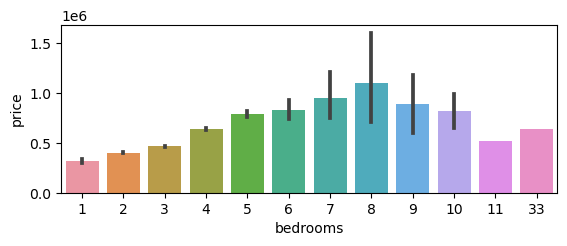

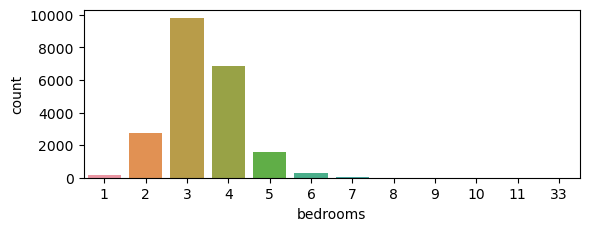

In [39]:
# plt.figure
# plt.subplot(2,1,1)
# sns.barplot(y=data['price'],x='bedrooms', data=categoricals)
# plt.show()
# plt.subplot(2,1,2)
# sns.countplot(x='bedrooms',data=categoricals)
# plt.show()

exploring categorical columns
notes:
- houses with more bathrooms sell for higher price (direct relationship)
--> maybe combine the two columns to see how many groups are created, first simplify bathrooms
--> OR bedrooms: create groupings of '1-3' & '4+' 
--> bathrooms:  create new column for the partial bath rooms, then group by number of bathrooms 
- 'view' group in to 0 and 1+
--> or combine 'view' and 'waterfront'
--> all waterfront houses had view of 2 or greater (except 1).
--> drop 'waterfront'
- for 'floor', remove the .5 and create new binary column for 'attic'. .5 = YES 
- 'yr_renovated' convert to binary (Y/N) column 'renovated'. Then drop 'yr_renovated'
- 'yr_built' group by decade or quarter-century or millenium (binary). 1900-2014
--> used pd.cut and pd.qcut (each with parm 4) and compared using barplot vs 'price'
--> obervation: older homes (pre-1950) and newer homes (after 1997) are more valuable. 
- data from 'zipcode' does not impact the data, considering dropping. 
--> encode zipcode with frequency encoding then group 
- 'condition' vs 'grade'
--> grouped condition into 1-7 and 8+

numerical columns
notes:
- sq_basement is better as an indicator as to whether the house has a basement or not as its sq_ft is included in the difference between the above & living sq_ft

Column Name:  bedrooms
3     9824
4     6882
2     2760
5     1601
6      272
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64


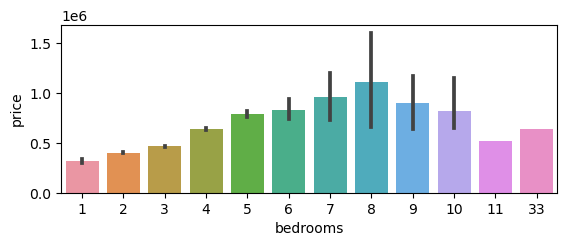

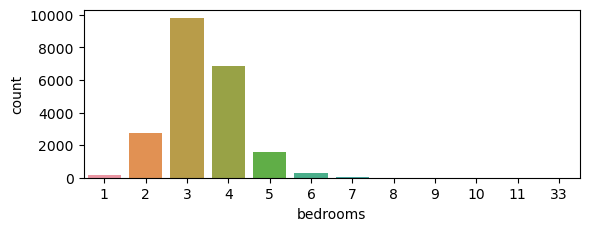

Column Name:  bathrooms
2.50    5377
1.00    3851
1.75    3048
2.25    2047
2.00    1930
1.50    1445
2.75    1185
3.00     753
3.50     731
3.25     589
3.75     155
4.00     136
4.50     100
4.25      79
0.75      71
4.75      23
5.00      21
5.25      13
5.50      10
1.25       9
6.00       6
0.50       4
5.75       4
6.75       2
8.00       2
6.25       2
6.50       2
7.50       1
7.75       1
Name: bathrooms, dtype: int64


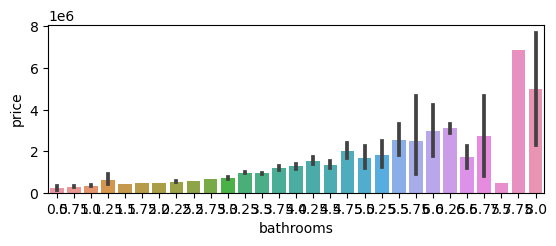

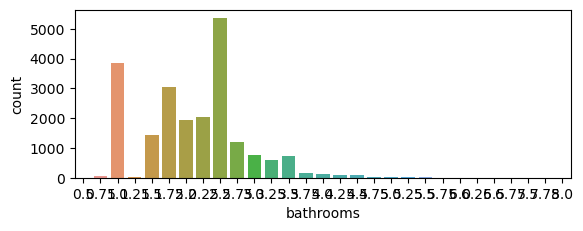

Column Name:  floors
1.0    10673
2.0     8235
1.5     1910
3.0      611
2.5      161
3.5        7
Name: floors, dtype: int64


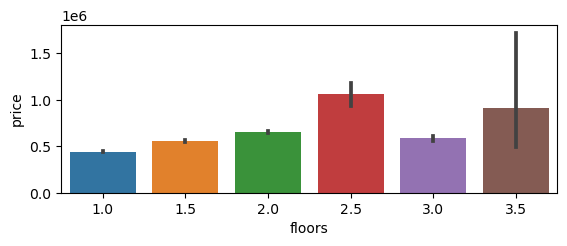

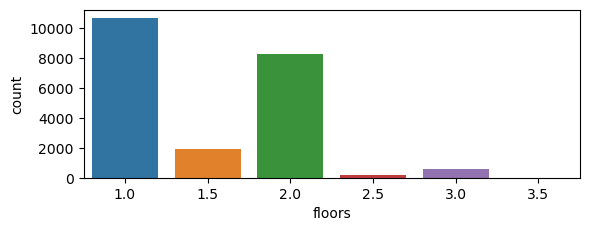

Column Name:  waterfront
0    21434
1      163
Name: waterfront, dtype: int64


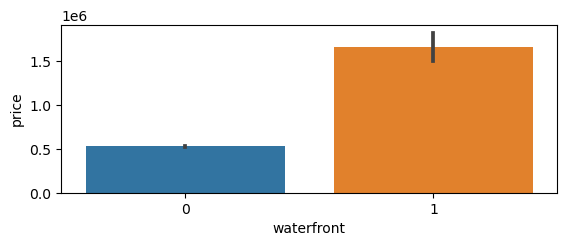

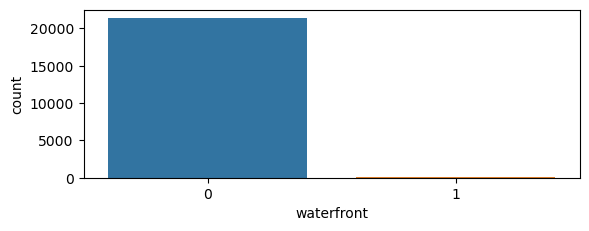

Column Name:  view
0    19475
2      961
3      510
1      332
4      319
Name: view, dtype: int64


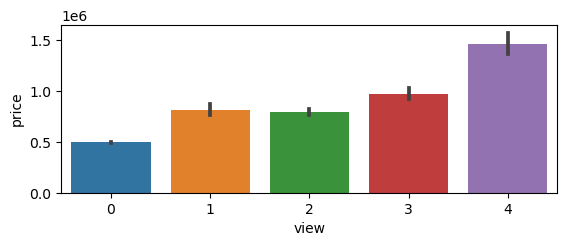

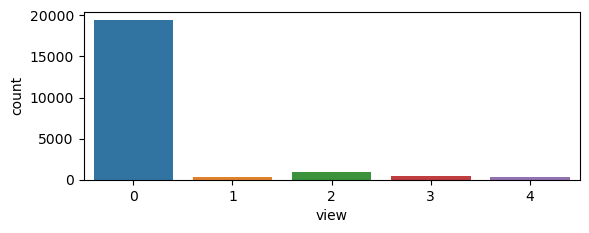

Column Name:  condition
3    14020
4     5677
5     1701
2      170
1       29
Name: condition, dtype: int64


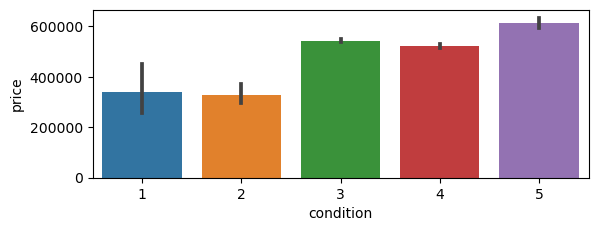

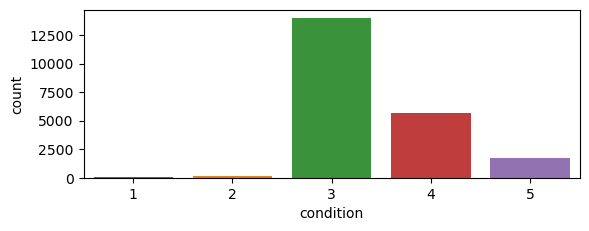

Column Name:  grade
7     8974
8     6065
9     2615
6     2038
10    1134
11     399
5      242
12      89
4       27
13      13
3        1
Name: grade, dtype: int64


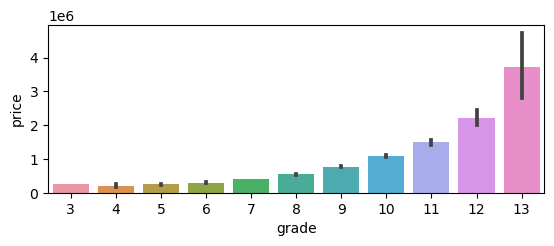

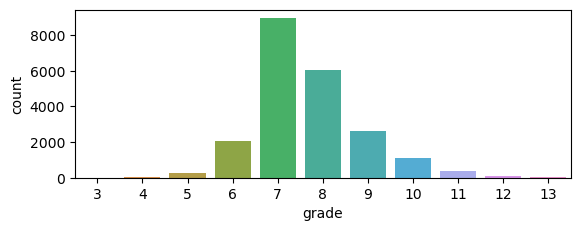

Column Name:  yr_built
2014    559
2006    453
2005    450
2004    433
2003    420
2007    417
1977    417
1978    387
1968    381
2008    367
1967    350
1979    343
1959    334
1990    317
1962    312
1954    305
2001    305
1987    294
1989    290
1969    280
1955    271
1988    270
1999    263
1947    263
1963    255
1976    253
1966    249
1994    249
1950    249
1960    248
1980    240
1998    239
1948    234
2009    230
1951    229
1984    229
1985    227
1961    224
1958    224
1991    224
1942    223
2002    222
1953    222
1952    220
2000    218
1986    215
1983    212
1993    202
2013    201
1981    199
1992    198
1957    198
1956    198
1949    195
1996    194
1975    189
1965    187
1926    180
1997    177
1964    172
2012    170
1943    170
1995    169
1925    165
1974    162
1941    161
1940    156
1972    149
1973    149
2010    143
1944    140
1924    139
1910    134
1970    132
2011    130
1928    126
1946    126
1918    120
1927    115
1929    114
1939    106
1982 

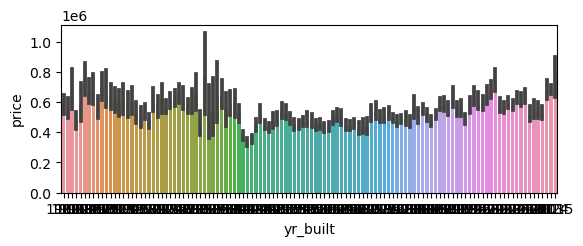

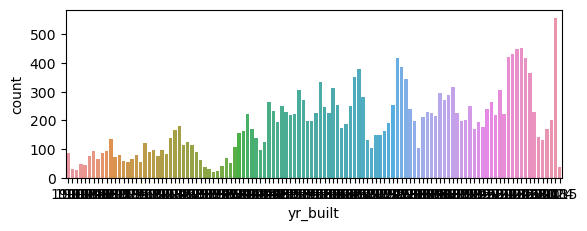

Column Name:  yr_renovated
0       20683
2014       91
2013       37
2003       36
2005       35
2007       35
2000       35
2004       26
1990       25
2006       24
2002       22
2009       22
1989       22
1991       20
1998       19
2001       19
1994       19
1993       19
1987       18
2010       18
2008       18
1983       18
1984       18
1985       17
1999       17
1992       17
1986       17
2015       16
1995       16
1988       15
1996       15
1997       15
2011       13
2012       11
1980       11
1982       11
1979       10
1970        9
1977        8
1968        8
1978        6
1975        6
1973        5
1965        5
1981        5
1964        5
1958        5
1960        4
1972        4
1963        4
1969        4
1976        3
1974        3
1953        3
1955        3
1956        3
1945        3
1957        3
1950        2
1962        2
1940        2
1946        2
1971        2
1967        2
1934        1
1951        1
1959        1
1948        1
1954        1
1944   

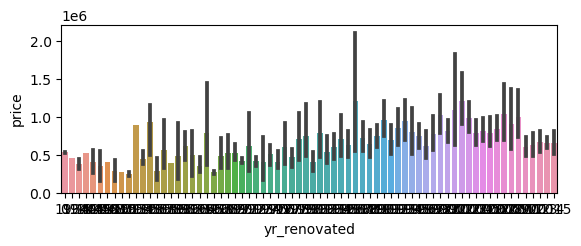

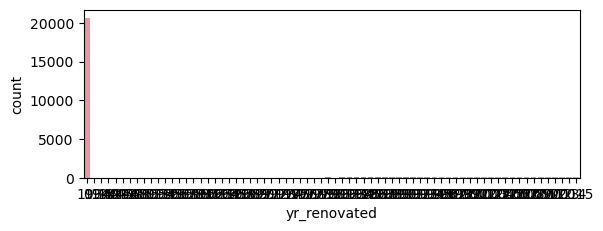

Column Name:  zipcode
98103    602
98038    589
98115    583
98052    574
98117    553
98042    547
98034    545
98118    507
98023    499
98006    498
98133    493
98059    468
98058    455
98155    446
98074    441
98033    432
98027    412
98125    409
98056    406
98053    403
98001    361
98075    359
98126    354
98092    351
98144    343
98106    335
98116    330
98029    321
98004    317
98199    317
98065    308
98122    290
98146    288
98008    283
98028    283
98040    282
98198    280
98003    280
98031    273
98072    273
98168    269
98112    269
98055    268
98107    266
98136    263
98178    262
98030    256
98177    255
98166    254
98022    233
98105    229
98045    220
98002    199
98077    198
98011    195
98019    190
98108    186
98119    184
98005    168
98007    141
98188    136
98032    125
98014    124
98070    117
98109    109
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, dtype: int64


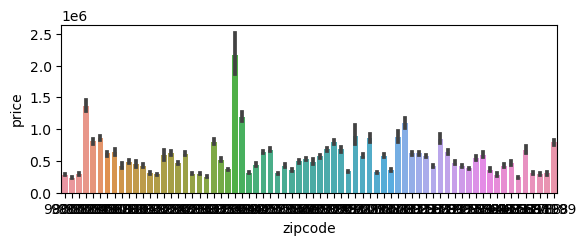

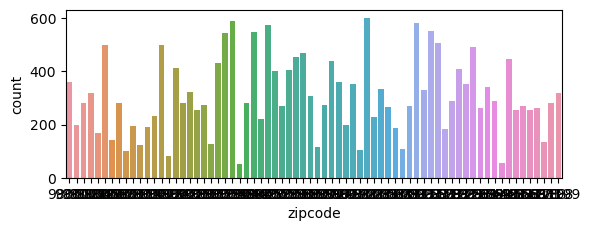

Column Name:  year_sold
2014    14622
2015     6975
Name: year_sold, dtype: int64


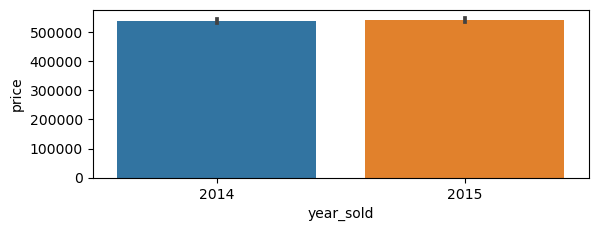

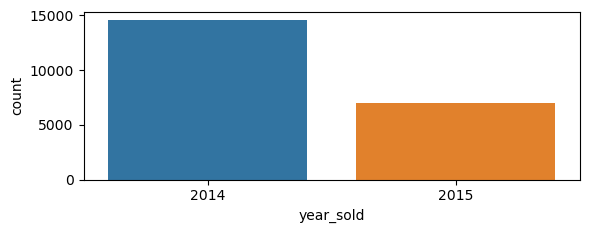

In [229]:
for col in categoricals.columns:
    print("Column Name: ",col)
    print(categoricals[col].value_counts())
    plt.subplot(2,1,1)
    sns.barplot(y=data['price'],x=col, data=categoricals)
    plt.show()
    plt.subplot(2,1,2)
    sns.countplot(x=col,data=categoricals)
    plt.show()

In [230]:
# yr.renovated to binary field
# list(map(lambda x: 1 if x > 0 else x, categoricals['yr_renovated']))
categoricals['renovated'] = list(map(lambda x: 1 if x > 0 else 0, categoricals['yr_renovated']))

In [45]:
# categoricals = categoricals.drop(['yr_renovated'],axis=1)

In [ ]:
# extract "attic" from floor column

In [81]:
# list(map(lambda x: str(x).split('.')[1], categoricals['floors']))

In [231]:
categoricals['attic'] = list(map(lambda x: 1 if str(x).split('.')[1] == '5' else 0, categoricals['floors']))

In [232]:
# 0 = single-floor. 1 = multi-floor house
categoricals['floors'] = list(map(lambda x: 1 if pd.to_numeric(str(x).split('.')[0]) >= 2 else 0, categoricals['floors']))

In [80]:
# list(map(lambda x: 1 if pd.to_numeric(str(x).split('.')[0]) >= 2 else 0, categoricals['floors']))

In [129]:
# categoricals['bathrooms']

0        1.00
1        2.25
2        1.00
3        3.00
4        2.00
5        4.50
6        2.25
7        1.50
8        1.00
9        2.50
10       2.50
11       1.00
12       1.00
13       1.75
14       2.00
15       3.00
16       2.00
17       1.00
18       1.00
19       1.00
20       1.75
21       2.75
22       2.50
23       1.50
24       2.25
25       2.00
26       1.75
27       1.00
28       1.75
29       2.50
30       2.50
31       1.50
32       1.75
33       1.00
34       2.75
35       2.50
36       1.00
37       2.00
38       1.00
39       2.50
40       2.50
41       2.25
42       2.75
43       1.00
44       1.00
45       2.50
46       1.00
47       2.50
48       1.75
49       2.50
50       1.00
51       2.50
52       1.75
53       1.75
54       2.25
55       2.50
56       2.50
57       2.50
58       3.25
59       3.00
60       2.25
61       1.75
62       1.75
63       1.75
64       2.25
65       2.75
66       2.50
67       2.50
68       1.00
69       2.25
70       3.25
71    

In [93]:
# categoricals['bathrooms2'] = categoricals['bathrooms']

In [136]:
# def split_br_b (x):
#     var = int(str(x).split('.'))
#     if var[1] == 25:
#         return 1
#     elif var[1] == 5:
#         return 2
#     elif var[1] == 75:
#         return 3
#     else:
#         return 0

In [234]:
def split_br_b (x):
    var = pd.to_numeric(str(x).split('.'))
    if var[1] == 25:
        return 0.25
    elif var[1] == 5:
        return .5
    elif var[1] == 75:
        return .75
    else:
        return 0

In [235]:
def split_br_a (x):
    var = pd.to_numeric(str(x).split('.'))
    return var[0]

In [146]:
# int(str(categoricals['bathrooms'][5]).split('.')[1])

5

In [236]:
categoricals['part_br'] = list(map(split_br_b,categoricals['bathrooms']))

In [237]:
categoricals['bathrooms_new'] = list(map(split_br_a,categoricals['bathrooms']))

In [238]:
categoricals.head(10)

,bedrooms,bathrooms,floors,waterfront,view,condition,grade,yr_built,yr_renovated,zipcode,year_sold,renovated,attic,part_br,bathrooms_new
0,3,1.00,0,0,0,3,7,1955,0,98178,2014,0,0,0.00,1
1,3,2.25,1,0,0,3,7,1951,1991,98125,2014,1,0,0.25,2
2,2,1.00,0,0,0,3,6,1933,0,98028,2015,0,0,0.00,1
3,4,3.00,0,0,0,5,7,1965,0,98136,2014,0,0,0.00,3
4,3,2.00,0,0,0,3,8,1987,0,98074,2015,0,0,0.00,2
5,4,4.50,0,0,0,3,11,2001,0,98053,2014,0,0,0.50,4
6,3,2.25,1,0,0,3,7,1995,0,98003,2014,0,0,0.25,2
7,3,1.50,0,0,0,3,7,1963,0,98198,2015,0,0,0.50,1
8,3,1.00,0,0,0,3,7,1960,0,98146,2015,0,0,0.00,1
9,3,2.50,1,0,0,3,7,2003,0,98038,2015,0,0,0.50,2


In [241]:
categoricals['built_qcut'] = pd.qcut(categoricals['yr_built'],4, labels= [0,1,2,3])

In [240]:
# categoricals['built_cut'] = pd.cut(categoricals['yr_built'],4, labels=['1900-1928','1929-1957', '1958-1986','1987-2015'])

In [144]:
# pd.concat([categoricals['built_cut'].value_counts(),categoricals['built_qcut'].value_counts()], axis=1)

,built_cut,built_qcut
1987-2015,7842.0,NaN
1958-1986,6928.0,NaN
1929-1957,4299.0,NaN
1900-1928,2528.0,NaN
1952-1975,NaN,5515.0
1900-1951,NaN,5413.0
1976-1997,NaN,5411.0
1997-2015,NaN,5258.0


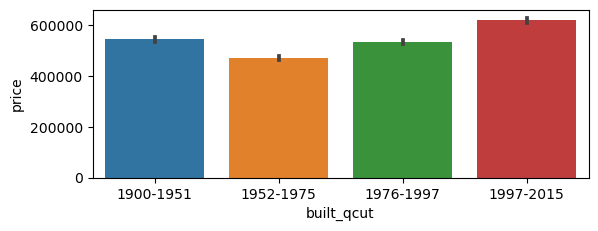

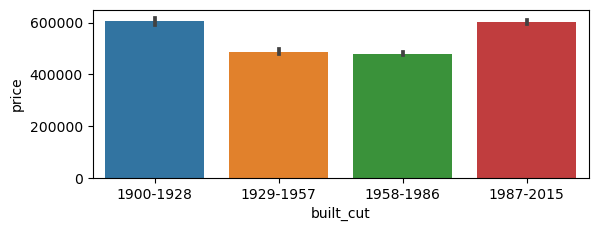

In [145]:
# plt.subplot(2,1,1)
# sns.barplot(y=data['price'],x=categoricals['built_qcut'], data=categoricals)
# plt.show()
# plt.subplot(2,1,2)
# sns.barplot(y=data['price'],x=categoricals['built_cut'], data=categoricals)
# plt.show()

In [242]:
# categoricals = categoricals.drop(['built_cut'],axis=1)

In [243]:
categoricals['view'].value_counts()/len(categoricals)

0    0.901746
2    0.044497
3    0.023614
1    0.015373
4    0.014771
Name: view, dtype: float64

It is statiscally insignificant that the property is waterfront as 90%+ of all waterfront properties have a vew of 3 or greater

In [148]:
# categoricals['bedroom_test_a'] =list(map(lambda x: 0 if x <= 4 else 1, categoricals['bedrooms']))

In [244]:
categoricals['bedroom_new'] =list(map(lambda x: 0 if x <= 3 else 1, categoricals['bedrooms']))

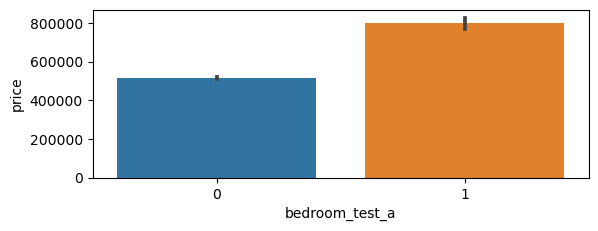

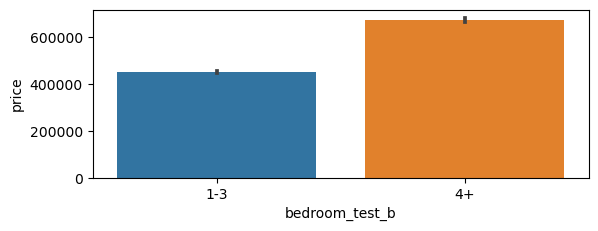

In [42]:
plt.subplot (2,1,1)
sns.barplot(x=categoricals['bedroom_test_a'], y=data['price'])
plt.show()
plt.subplot (2,1,2)
sns.barplot(x=categoricals['bedroom_new'], y=data['price'])
plt.show()

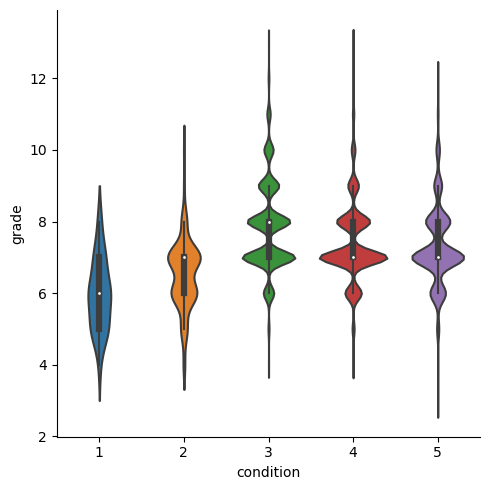

In [32]:
sns.catplot(data=categoricals, x="condition", y="grade", kind="violin")

In [60]:
# pd.concat([categoricals['grade'].value_counts(),categoricals['condition'].value_counts()], axis=1, sort=True)

In [245]:
categoricals['grade_new'] =list(map(lambda x: 0 if x <= 7 else 1, categoricals['grade']))

<Axes: xlabel='grade_new', ylabel='price'>

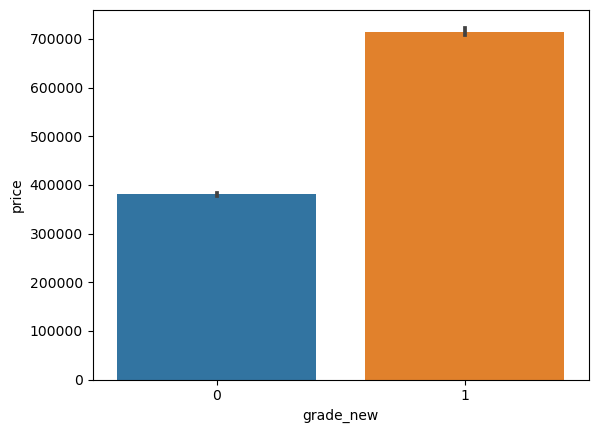

In [246]:
sns.barplot(x=categoricals['grade_new'],y=data['price'])

In [165]:
# # def zip_mean (x):
#     for i in x:
#         str(x)
#         return np.mean(data['price'][x==i])

In [247]:
# list(map(zip_mean,categoricals['zipcode']))

In [251]:
categoricals['year_sold'] = list(map(lambda x: 0 if x == 2014 else 1,categoricals['year_sold']))

In [248]:
categoricals = categoricals.drop(['zipcode','bathrooms','yr_built','yr_renovated','waterfront', 'bedrooms', 'grade'],axis=1)

In [184]:
# categoricals = categoricals.drop(['bathrooms_NEW','new_zip'],axis=1)

In [252]:
categoricals.head()

,floors,view,condition,year_sold,renovated,attic,part_br,bathrooms_new,built_qcut,bedroom_new,grade_new
0,0,0,3,0,0,0,0.00,1,1,0,0
1,1,0,3,0,1,0,0.25,2,0,0,0
2,0,0,3,1,0,0,0.00,1,0,0,0
3,0,0,5,0,0,0,0.00,3,1,1,0
4,0,0,3,1,0,0,0.00,2,2,0,1


Column Name:  floors
0    12583
1     9014
Name: floors, dtype: int64


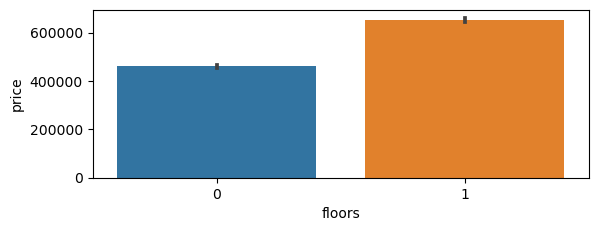

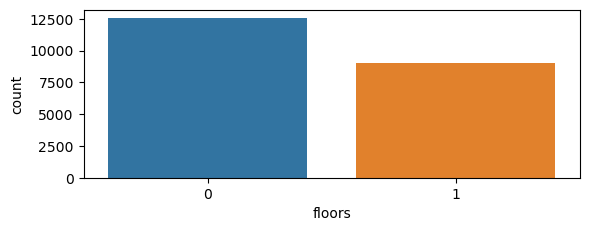

Column Name:  view
0    19475
2      961
3      510
1      332
4      319
Name: view, dtype: int64


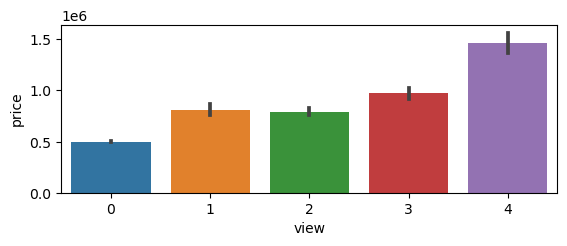

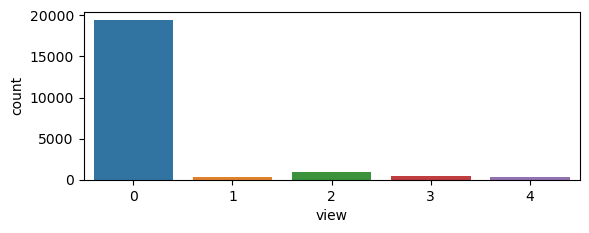

Column Name:  condition
3    14020
4     5677
5     1701
2      170
1       29
Name: condition, dtype: int64


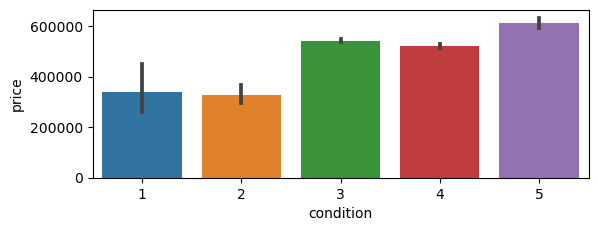

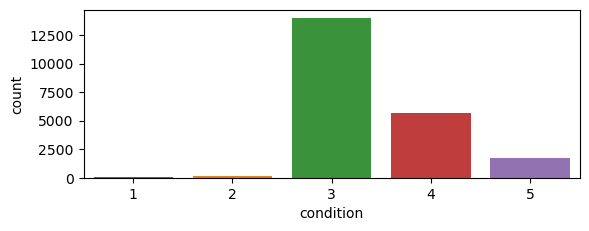

Column Name:  year_sold
0    14622
1     6975
Name: year_sold, dtype: int64


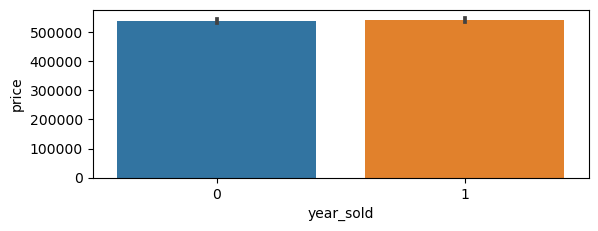

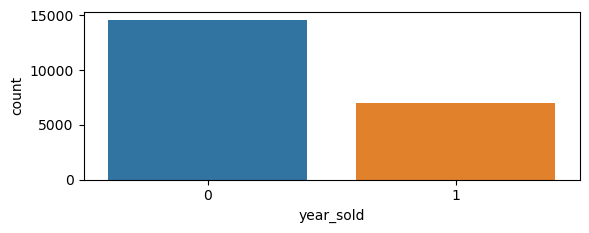

Column Name:  renovated
0    20683
1      914
Name: renovated, dtype: int64


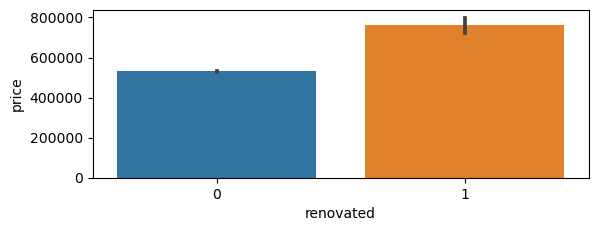

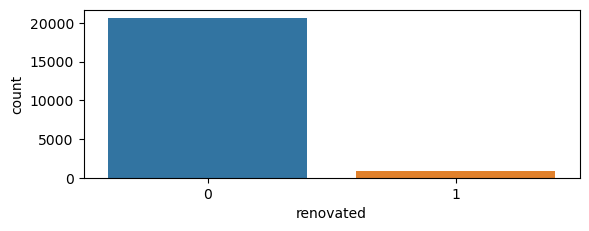

Column Name:  attic
0    19519
1     2078
Name: attic, dtype: int64


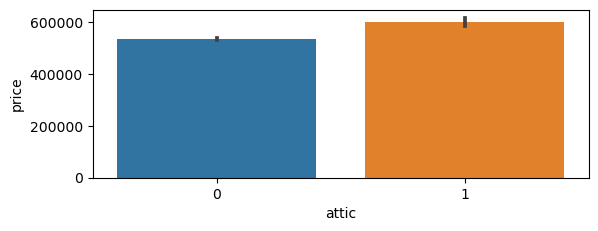

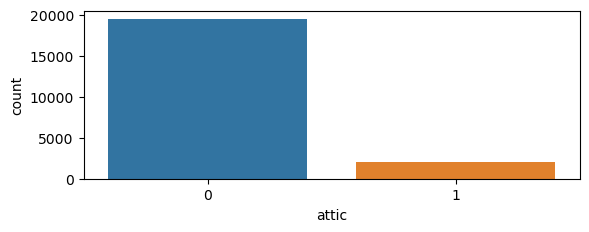

Column Name:  part_br
0.50    7670
0.00    6699
0.75    4489
0.25    2739
Name: part_br, dtype: int64


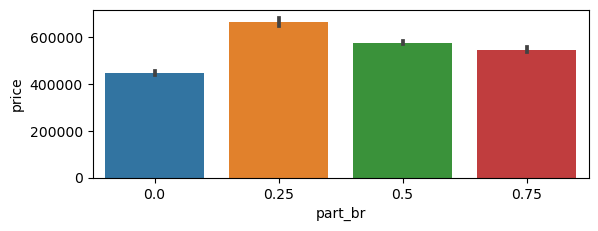

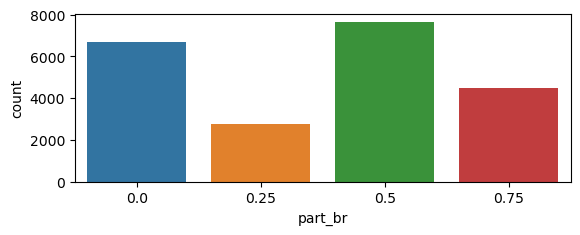

Column Name:  bathrooms_new
2    10539
1     8353
3     2228
4      338
0       75
5       48
6       12
8        2
7        2
Name: bathrooms_new, dtype: int64


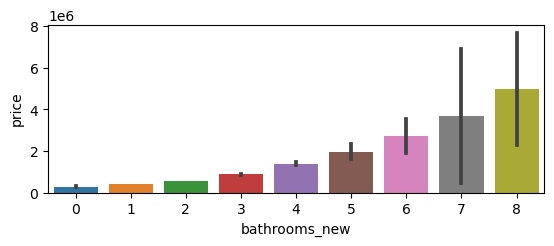

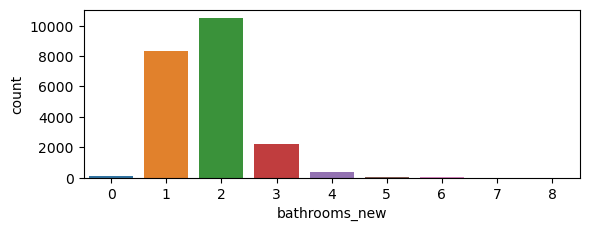

Column Name:  built_qcut
1    5515
0    5413
2    5411
3    5258
Name: built_qcut, dtype: int64


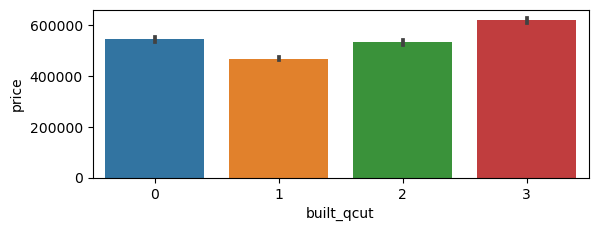

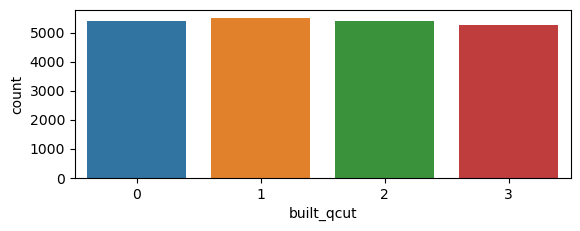

Column Name:  bedroom_new
0    12780
1     8817
Name: bedroom_new, dtype: int64


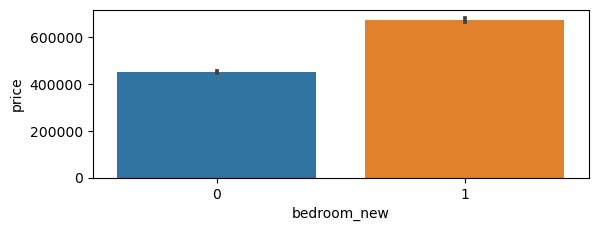

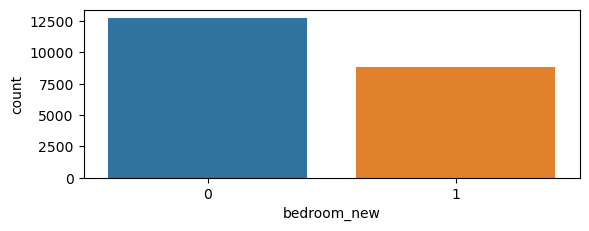

Column Name:  grade_new
0    11282
1    10315
Name: grade_new, dtype: int64


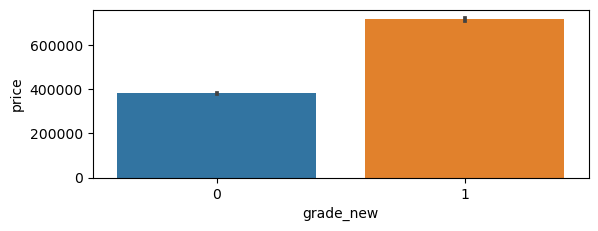

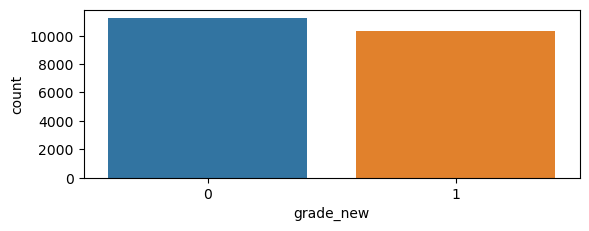

In [253]:
for col in categoricals.columns:
    print("Column Name: ",col)
    print(categoricals[col].value_counts())
    plt.subplot(2,1,1)
    sns.barplot(y=data['price'],x=col, data=categoricals)
    plt.show()
    plt.subplot(2,1,2)
    sns.countplot(x=col,data=categoricals)
    plt.show()

In [254]:
numericals.head()

,sqft_living,sqft_lot,sqft_above,sqft_basement,sqft_living15,sqft_lot15,price
0,1180,5650,1180,0,1340,5650,221900
1,2570,7242,2170,400,1690,7639,538000
2,770,10000,770,0,2720,8062,180000
3,1960,5000,1050,910,1360,5000,604000
4,1680,8080,1680,0,1800,7503,510000


In [255]:
numericals.corr()

,sqft_living,sqft_lot,sqft_above,sqft_basement,sqft_living15,sqft_lot15,price
sqft_living,1.000000,0.173453,0.876448,0.435130,0.756402,0.184342,0.701917
sqft_lot,0.173453,1.000000,0.184139,0.015418,0.144763,0.718204,0.089876
sqft_above,0.876448,0.184139,1.000000,-0.052156,0.731767,0.195077,0.605368
sqft_basement,0.435130,0.015418,-0.052156,1.000000,0.200443,0.017550,0.323799
sqft_living15,0.756402,0.144763,0.731767,0.200443,1.000000,0.183515,0.585241
sqft_lot15,0.184342,0.718204,0.195077,0.017550,0.183515,1.000000,0.082845
price,0.701917,0.089876,0.605368,0.323799,0.585241,0.082845,1.000000


<Axes: >

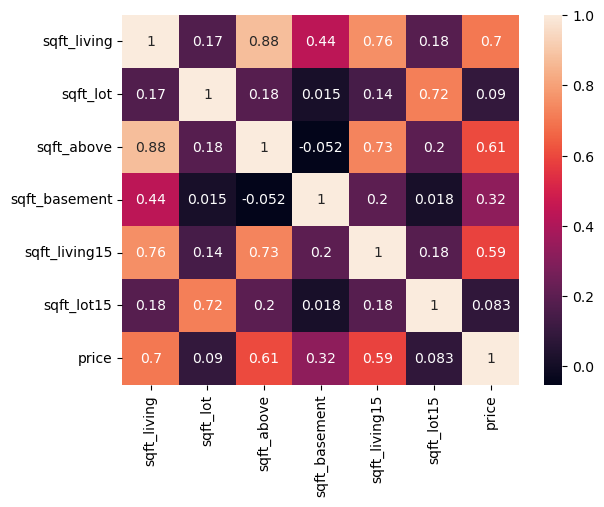

In [256]:
sns.heatmap(numericals.corr(), annot=True)

In [257]:
categoricals['has_basement'] = list(map(lambda x: 1 if x > 1 else 0, numericals['sqft_basement']))

In [258]:
numericals = numericals.drop(['sqft_basement'],axis=1)

In [259]:
numericals = numericals.drop(['sqft_living'],axis=1)

In [260]:
numericals = numericals.drop(['sqft_above'],axis=1)

<Axes: >

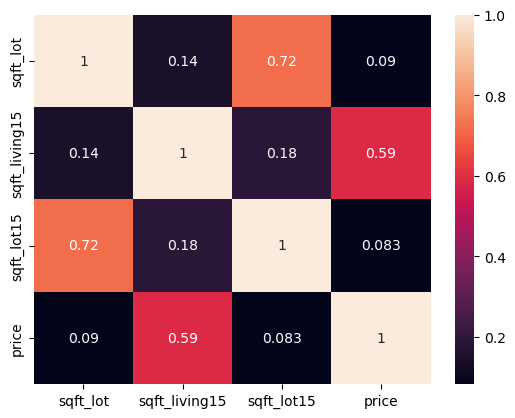

In [261]:
sns.heatmap(numericals.corr(), annot=True)

In [262]:
encoder = OneHotEncoder(drop='first')
encoded_cate = pd.DataFrame(encoder.fit_transform(categoricals).toarray())

In [263]:
encoded_cate.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [189]:
numericals = numericals.drop(['price'],axis=1)
y = data['price']

In [192]:
mm_scal = MinMaxScaler()
scaled_num = pd.DataFrame(mm_scal.fit_transform(numericals))

In [200]:
stand_scal = StandardScaler()
scaled_num = pd.DataFrame(stand_scal.fit_transform(numericals))

In [209]:
norm_scal = Normalizer()
scaled_num = pd.DataFrame(norm_scal.fit_transform(numericals))

In [171]:
scaled_num

,0,1,2,3,4,5,6
0,-0.980652,-0.228182,-0.735251,-0.659031,-0.943676,-0.260627,-0.866716
1,0.533369,-0.189739,0.460776,0.244602,-0.432887,-0.187700,-0.006252
2,-1.427234,-0.123139,-1.230575,-0.659031,1.070292,-0.172190,-0.980773
3,-0.131057,-0.243878,-0.892305,1.396734,-0.914488,-0.284459,0.173409
4,-0.436040,-0.169503,-0.131197,-0.659031,-0.272353,-0.192686,-0.082471
5,3.637657,2.096766,2.538722,2.797366,4.047461,3.269500,1.877461
6,-0.397917,-0.199953,-0.088913,-0.659031,0.366863,-0.217765,-0.769809
7,-1.111359,-0.130118,-0.880224,-0.659031,-0.491263,-0.111729,-0.676303
8,-0.327118,-0.184233,-0.892305,0.990099,-0.301541,-0.170320,-0.846028
9,-0.207303,-0.206208,0.122506,-0.659031,0.588691,-0.190230,-0.591509


In [210]:
features = pd.concat([scaled_num,encoded_cate],axis=1)

In [198]:
import math

In [274]:
x_train, x_test, y_train, y_test = train_test_split(features, y, test_size=0.3, random_state=10)

In [276]:
scores = []
complexity = []
for i in range(1,100, 5):
    model = KNeighborsRegressor(n_neighbors=i)
    model.fit(x_train, y_train)
    predictions_ = model.predict(x_test)
    scores.append(math.sqrt(mean_squared_error(y_test, predictions_)))
    complexity.append(np.log(1/i))

Text(0, 0.5, 'RMSE')

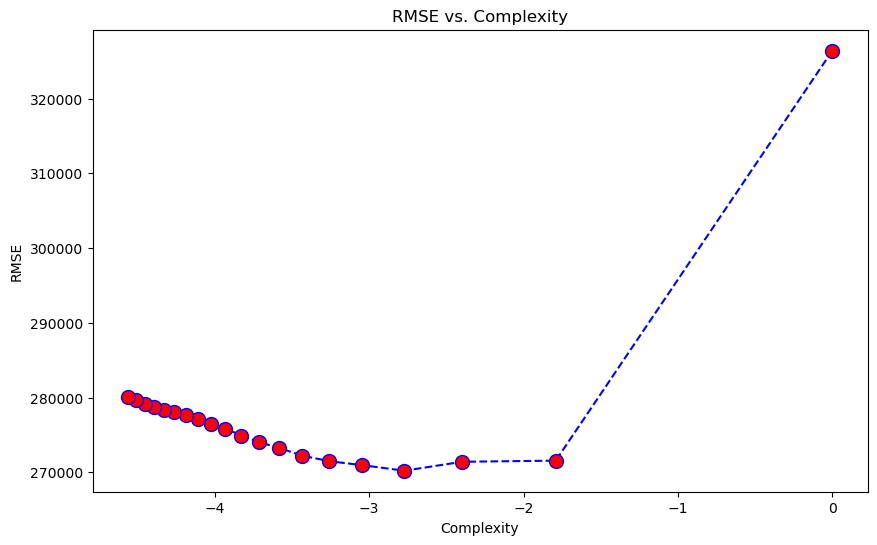

In [277]:
plt.figure(figsize=(10,6))
plt.plot(complexity,scores,color = 'blue',linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('RMSE vs. Complexity')
plt.xlabel('Complexity')
plt.ylabel('RMSE')

In [278]:
pd.DataFrame([range(1,100, 5),scores,complexity]).T

,0,1,2
0,1.0,326411.127307,0.000000
1,6.0,271565.425742,-1.791759
2,11.0,271415.239094,-2.397895
3,16.0,270217.573124,-2.772589
4,21.0,270959.298788,-3.044522
5,26.0,271492.386184,-3.258097
6,31.0,272230.279208,-3.433987
7,36.0,273263.186778,-3.583519
8,41.0,274046.451187,-3.713572
9,46.0,274927.505493,-3.828641


In [266]:
mm_scaler = pd.DataFrame(MinMaxScaler().fit_transform(numericals))
std_scaler = pd.DataFrame(StandardScaler().fit_transform(numericals))
normal_scaler = pd.DataFrame(Normalizer().fit_transform(numericals))

In [193]:
lm_model = LinearRegression()
mlp_model = MLPRegressor()
knn_model = KNeighborsRegressor(n_neighbors=16)

In [267]:
scal_list = [mm_scaler,std_scaler,normal_scaler]

In [194]:
model_list = [lm_model,knn_model,mlp_model]

In [271]:
def model_run(x,y,model):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=10)
    model.fit(x_train, y_train)
    predictions = model.predict(x_test)
    r2 = r2_score(y_test, predictions)
    rmse = math.sqrt(mean_squared_error(y_test, predictions))
    mae = mean_absolute_error(y_test, predictions)
    return print(model,'\n',"R2 Score: ",r2,'\n', "RMSE Score: ",rmse,'\n', "MAE Score:", mae)

In [272]:
for i in model_list:
    model_run(features, y, i)

LinearRegression() 
 R2 Score:  0.458720042170624 
 RMSE Score:  265264.79709639424 
 MAE Score: 165634.40766582935
KNeighborsRegressor(n_neighbors=16) 
 R2 Score:  0.43831880173466775 
 RMSE Score:  270217.5731244223 
 MAE Score: 157635.20578703703
MLPRegressor() 
 R2 Score:  -1.0611779304236824 
 RMSE Score:  517638.2827417189 
 MAE Score: 380166.7484744311


C:\Users\Gabriel Valdes\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [203]:
for i in model_list:
    model_run(features, y, i)

LinearRegression() 
 R2 Score:  0.5310630123774717 
 RMSE Score:  246902.7292062979 
 MAE Score: 152168.45678836358
KNeighborsRegressor(n_neighbors=16) 
 R2 Score:  0.5398325860130679 
 RMSE Score:  244583.17404479656 
 MAE Score: 142775.3609664352
MLPRegressor() 
 R2 Score:  -0.9821801602106988 
 RMSE Score:  507621.7341115706 
 MAE Score: 379957.0341019156


C:\Users\Gabriel Valdes\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [211]:
for i in model_list:
    model_run(features, y, i)

LinearRegression() 
 R2 Score:  0.458720042170624 
 RMSE Score:  265264.79709639424 
 MAE Score: 165634.40766582935
KNeighborsRegressor(n_neighbors=16) 
 R2 Score:  0.43831880173466775 
 RMSE Score:  270217.5731244223 
 MAE Score: 157635.20578703703
MLPRegressor() 
 R2 Score:  -0.9976403768031556 
 RMSE Score:  509597.51280101977 
 MAE Score: 369770.7950092481


C:\Users\Gabriel Valdes\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
